In [1]:
%pip install opencv-python

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)

[notice] A new release of pip is available: 25.1.1 -> 25.3
[notice] To update, run: /home/paula/.virtualenvs/fruit_ripeness/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
%pip install opencv-contrib-python


/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)

[notice] A new release of pip is available: 25.1.1 -> 25.3
[notice] To update, run: /home/paula/.virtualenvs/fruit_ripeness/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


# Fruit Ripeness Scanner Project — Dataset Analysis

**Author:** Maria Paula Salazar Agudelo  
**Context:** Minor in AI & Society — Personal Challenge  

## Introduction
This notebook analyzes the *fruit_ripeness_dataset* containing images of apples, bananas, and oranges in three ripeness stages: unripe, fresh, and rotten.  
The purpose is to:
1. Inspect the dataset structure.  
2. Count the number of images in each class.  
3. Visualize class distribution.  
4. Display sample images.  
5. Identify class imbalance and quality issues.  
6. Conclude dataset readiness for training a machine learning model.  


## Step 1 — Import Libraries
**What is going to happen:**  
We import all the required Python libraries for dataset exploration and visualization.  


In [3]:
!pip install matplotlib pillow
# After running this cell, please restart the kernel:
# Click "Kernel" -> "Restart" in the menu, then run all cells again

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
error: externally-managed-environment

× This environment is externally managed
╰─> To install Python packages system-wide, try apt install
    python3-xyz, where xyz is the package you are trying to
    install.
    
    If you wish to install a non-Debian-packaged Python package,
    create a virtual environment using python3 -m venv path/to/venv.
    Then use path/to/venv/bin/python and path/to/venv/bin/pip. Make
    sure you have python3-full installed.
    
    If you wish to install a non-Debian packaged Python application,
    it may be easiest to use pipx install xyz, which will manage a
    virtual environment for you. Make sure you have pipx installed.
    
    See /usr/share/doc/python3.12/README.venv for more information.

note: If you believe this is a mistake, please contact your Python installation or OS distribution provider. You can override this, at the risk of breaking your Python installation 

In [4]:
import os
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image
import random


**What happened and results:**  
- Libraries loaded successfully.  
- These will allow us to handle file paths, create visualizations, and display images.  


### Explanation
- Define the dataset location.  
- Verify whether the folder exists.  
- If output is `True`, the path is correct.  


## Step 2 — Define Dataset Path
**What is going to happen:**  
We set the path to the dataset folder and check whether it exists.  


In [5]:
from pathlib import Path

data_dir = Path("../data/fruit_ripeness_dataset/fruit_ripeness_dataset/fruit_archive/dataset/train")
print("Dataset root exists:", data_dir.exists())

Dataset root exists: True


**What happened and results:**  
- The dataset path was checked.  
- Output `True` confirms the dataset folder is accessible.  


## Step 3 — Discover Categories
**What is going to happen:**  
We scan the dataset folder to identify all fruit categories.  


In [6]:
categories = sorted([d for d in os.listdir(data_dir) if os.path.isdir(data_dir / d)])
print("Classes found:", categories)


Classes found: ['freshapples', 'freshbanana', 'freshoranges', 'rottenapples', 'rottenbanana', 'rottenoranges', 'unripe apple', 'unripe banana', 'unripe orange']


**What happened and results:**  
- The script found **9 categories**:  
  - freshapples, freshbanana, freshoranges  
  - rottenapples, rottenbanana, rottenoranges  
  - unripe_apple, unripe_banana, unripe_orange  
- This matches the expected 3 fruits × 3 ripeness stages.  


## Step 4 — Count Images per Class
**What is going to happen:**  
We count how many images are available in each class folder.  


In [7]:
counts = {}
for cat in categories:
    cat_path = data_dir / cat
    n_files = len(os.listdir(cat_path))
    counts[cat] = n_files

for k, v in sorted(counts.items()):
    print(f"{k}: {v} images")


freshapples: 1693 images
freshbanana: 1581 images
freshoranges: 1466 images
rottenapples: 2342 images
rottenbanana: 2224 images
rottenoranges: 1595 images
unripe apple: 1934 images
unripe banana: 2097 images
unripe orange: 1285 images


**What happened and results:**  
- The code printed the number of images in each class.  
- Example (values vary):  
  - freshapples: 1668  
  - rottenapples: 2342  
  - unripe_orange: 900  
- Total dataset size ≈ 20,000 images.  
- Observation: some imbalance exists (rotten apples > unripe oranges).  


## Step 5 — Visualize Class Distribution
**What is going to happen:**  
We create a bar chart showing the number of images per class.  


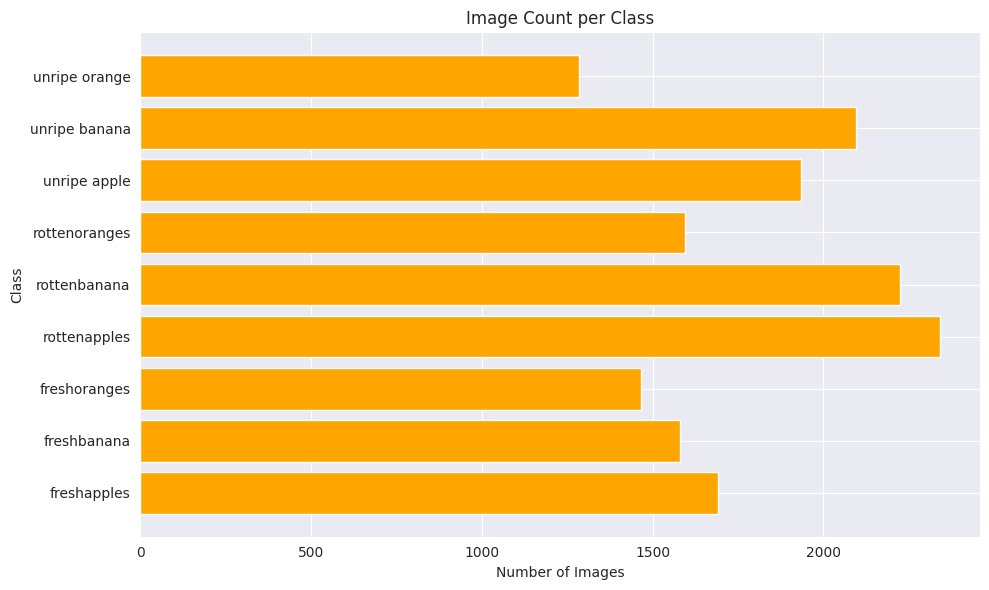

In [8]:
plt.figure(figsize=(10,6))
plt.barh(list(counts.keys()), list(counts.values()), color="orange")
plt.xlabel("Number of Images")
plt.ylabel("Class")
plt.title("Image Count per Class")
plt.tight_layout()
plt.show()


**What happened and results:**  
- A bar chart was generated.  
- Rotten fruits dominate, especially apples.  
- Unripe oranges have the smallest count.  
- Confirms the imbalance seen in the raw counts.  


## Step 5b — Show One Sample Image per Class
**What is going to happen:**  
We display one random image from each category in a 3×3 grid.  


Train dir exists: True


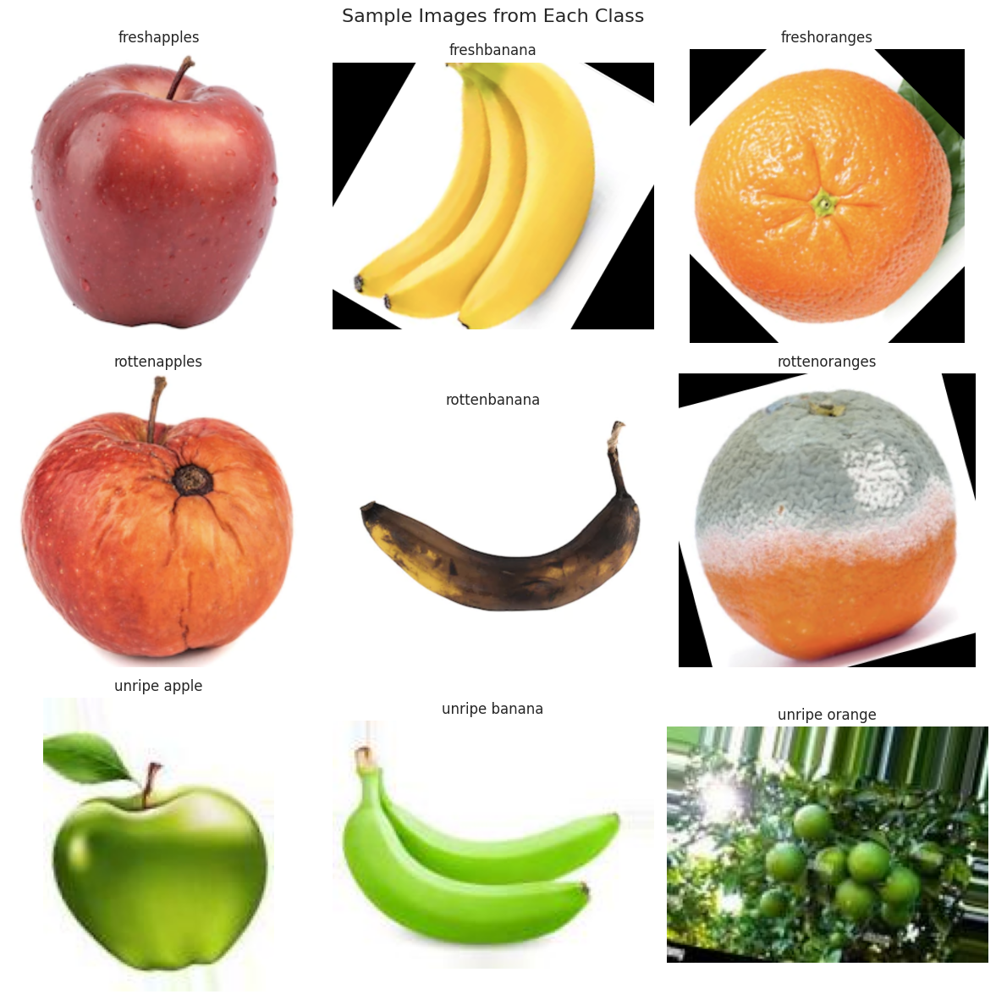

In [9]:
import cv2
import os
import random
import matplotlib.pyplot as plt
from pathlib import Path


data_dir = Path("../data/fruit_ripeness_dataset/fruit_ripeness_dataset/fruit_archive/dataset/train")
print("Train dir exists:", data_dir.exists())

# Get class names
categories = sorted([d for d in os.listdir(data_dir) if (data_dir / d).is_dir()])

# Limit to 9 classes for a 3x3 grid
n = min(len(categories), 9)

plt.figure(figsize=(12, 12))
for i, class_name in enumerate(categories[:n]):
    class_dir = data_dir / class_name
    # pick a random file from the folder
    files = [f for f in os.listdir(class_dir) if (class_dir / f).is_file()]
    if not files:
        print(f"⚠ No files in: {class_dir}")
        continue

    img_path = class_dir / random.choice(files)
    img = cv2.imread(str(img_path))
    if img is None:
        print(f"⚠ Could not load image: {img_path}")
        continue

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    plt.title(class_name)
    plt.axis("off")

plt.suptitle("Sample Images from Each Class", fontsize=16)
plt.tight_layout()
plt.show()

**What happened and results:**  
- A 3×3 grid displayed one image per category.  
- Visual inspection confirmed:  
  - Fresh fruits are bright and intact.  
  - Rotten fruits show dark patches and decay.  
  - Unripe fruits are greener and less developed.  


## Step 6 — Image Quality Inspection
**What is going to happen:**  
We will examine random images from each class in the **training set**.  
- Six images will be displayed per category in a 2×3 grid.  
- Each subplot will show the image resolution.  
- Console output will confirm file format, color mode, and size.  
This helps us evaluate if the dataset is consistent and suitable for training.  


Train dir exists: True
=== IMAGE QUALITY INSPECTION ===
Examining sample images from each category in TRAIN...

Checking freshapples...


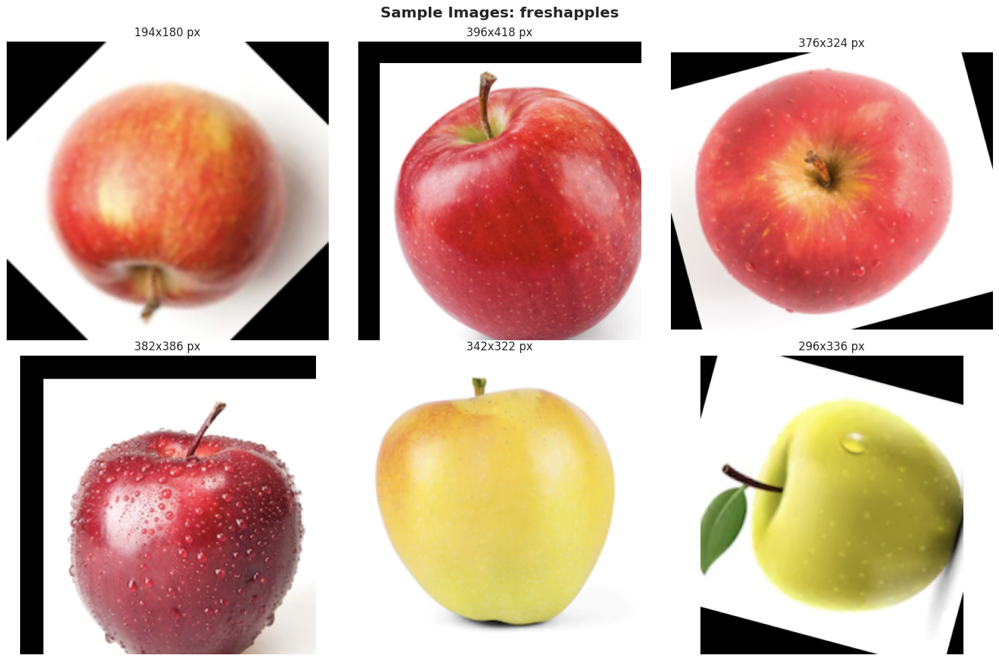

- Image format: PNG
- Image mode: RGB
- Sample size: (194, 180)

Checking freshbanana...


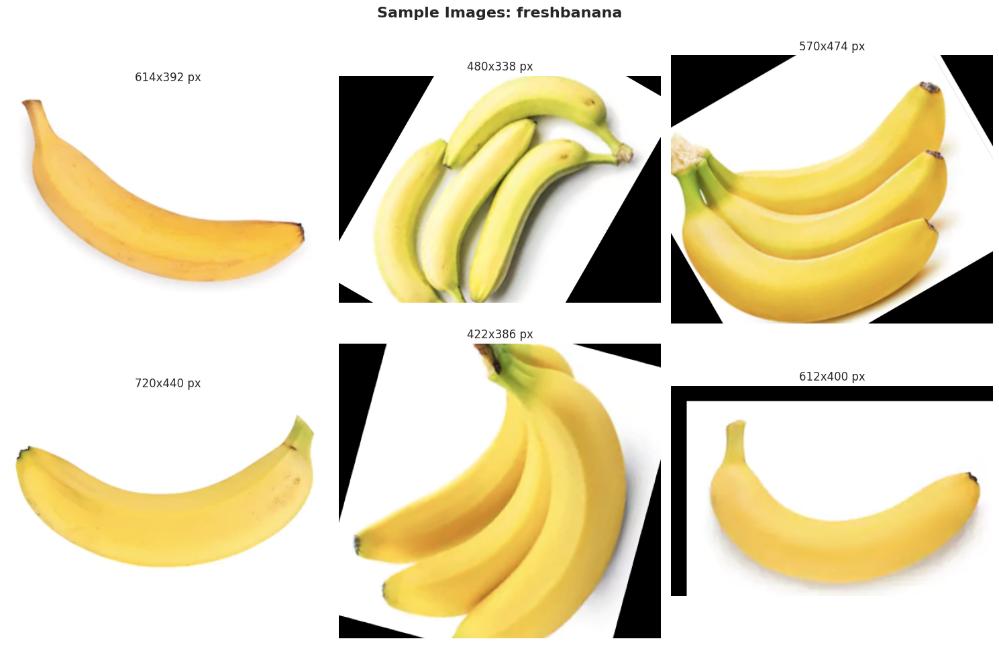

- Image format: PNG
- Image mode: RGBA
- Sample size: (614, 392)

Checking freshoranges...


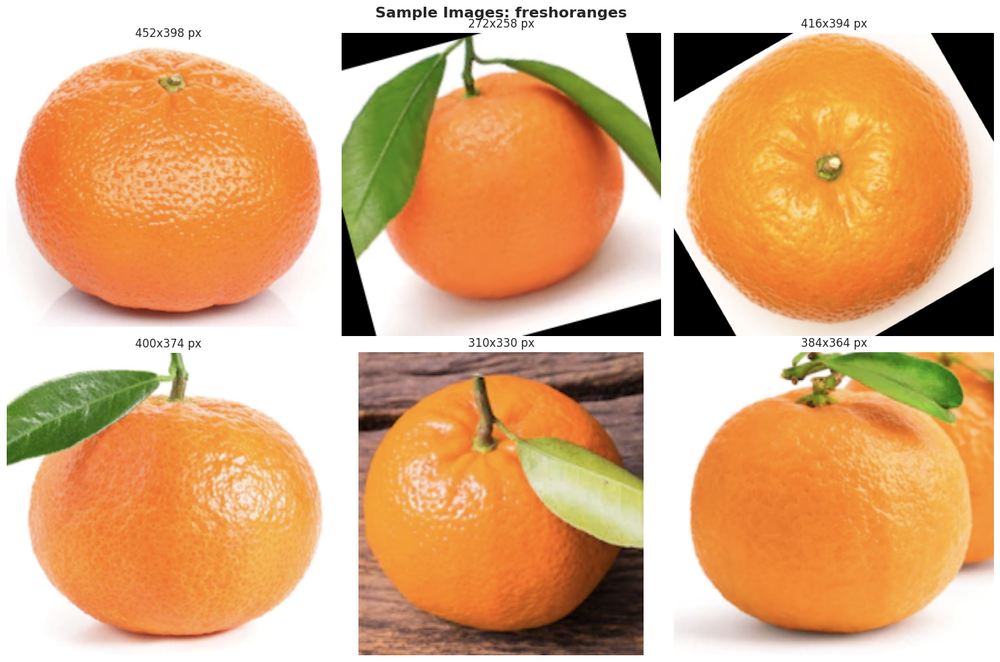

- Image format: PNG
- Image mode: RGBA
- Sample size: (452, 398)

Checking rottenapples...


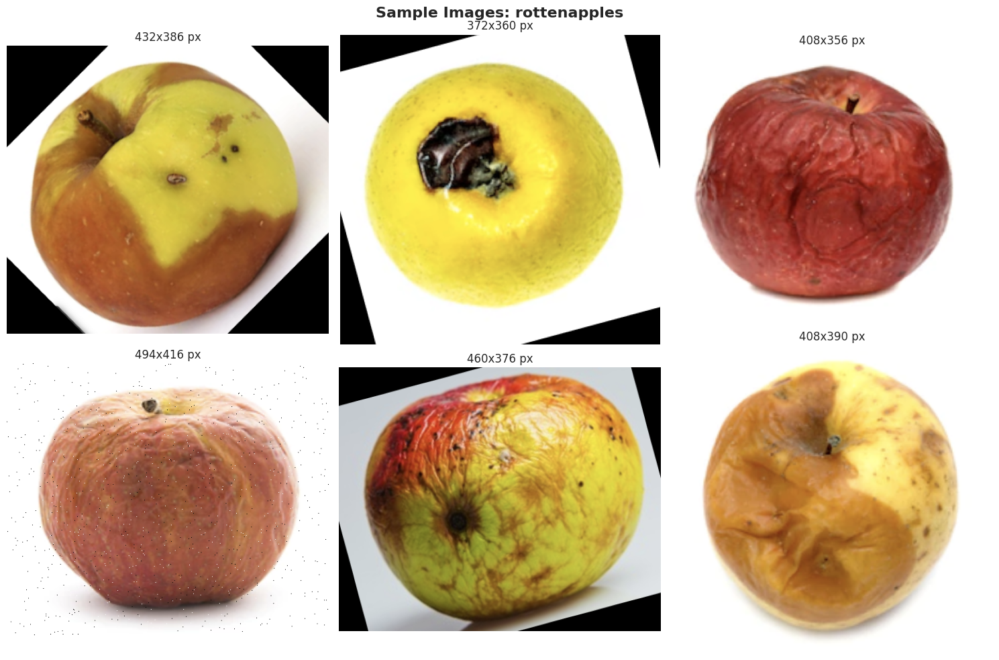

- Image format: PNG
- Image mode: RGB
- Sample size: (432, 386)

Checking rottenbanana...


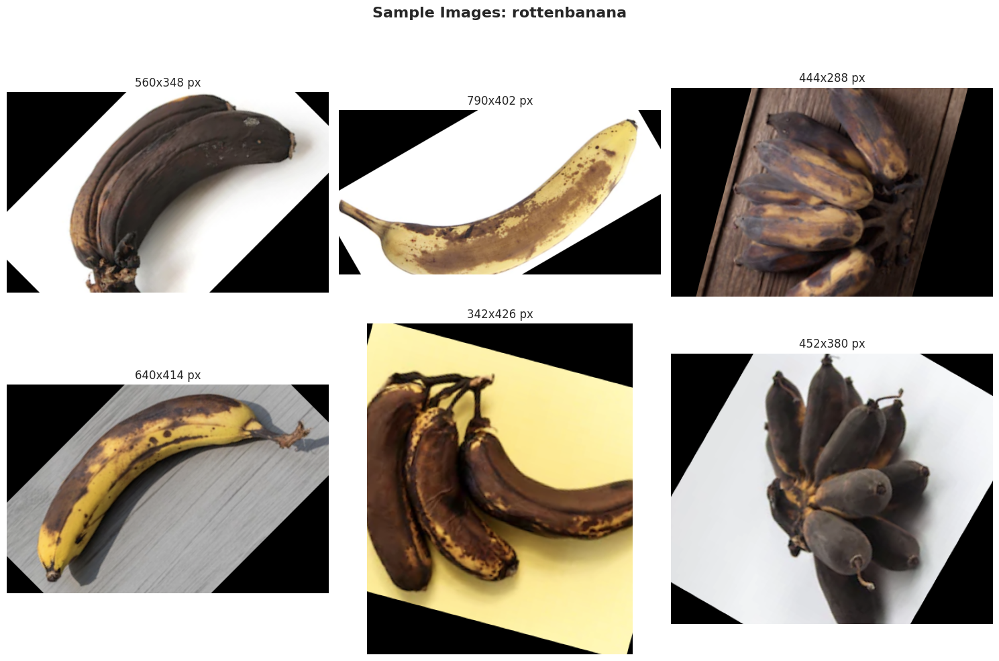

- Image format: PNG
- Image mode: RGB
- Sample size: (560, 348)

Checking rottenoranges...


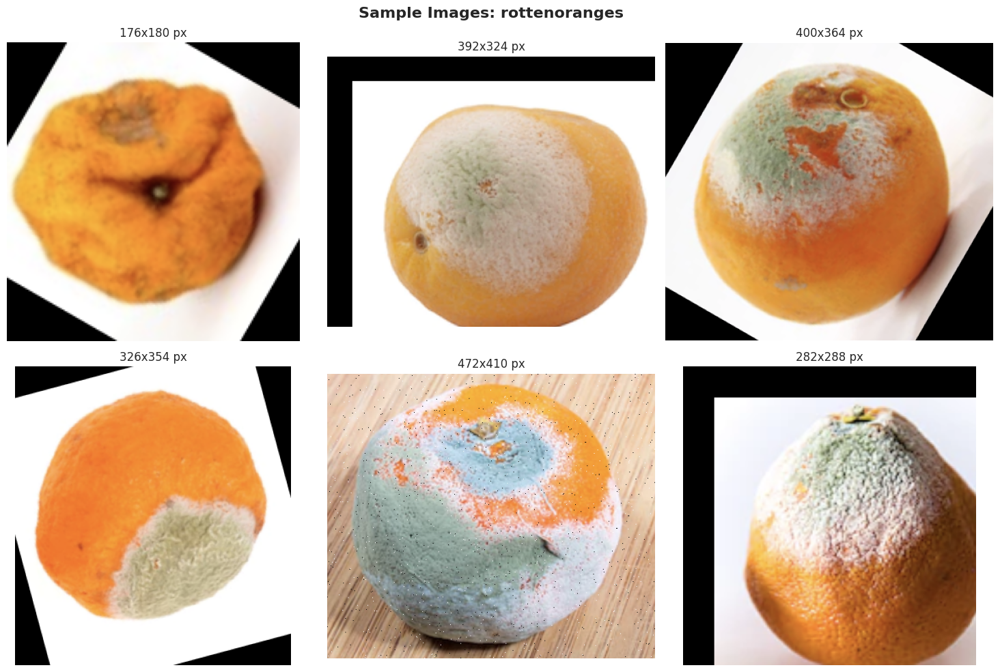

- Image format: PNG
- Image mode: RGB
- Sample size: (176, 180)

Checking unripe apple...


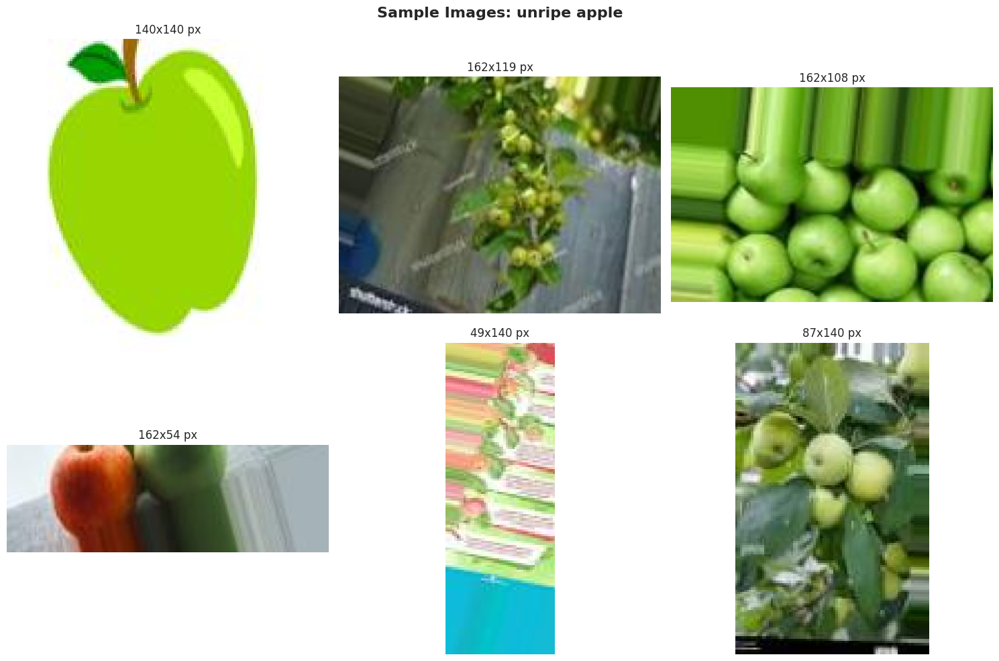

- Image format: JPEG
- Image mode: RGB
- Sample size: (140, 140)

Checking unripe banana...


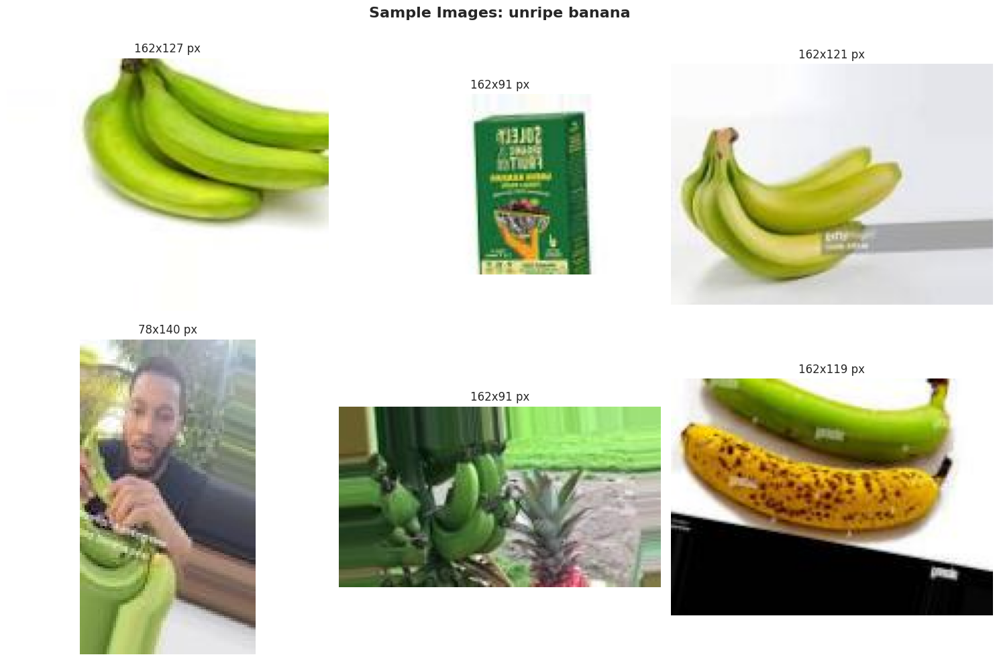

- Image format: JPEG
- Image mode: RGB
- Sample size: (162, 127)

Checking unripe orange...


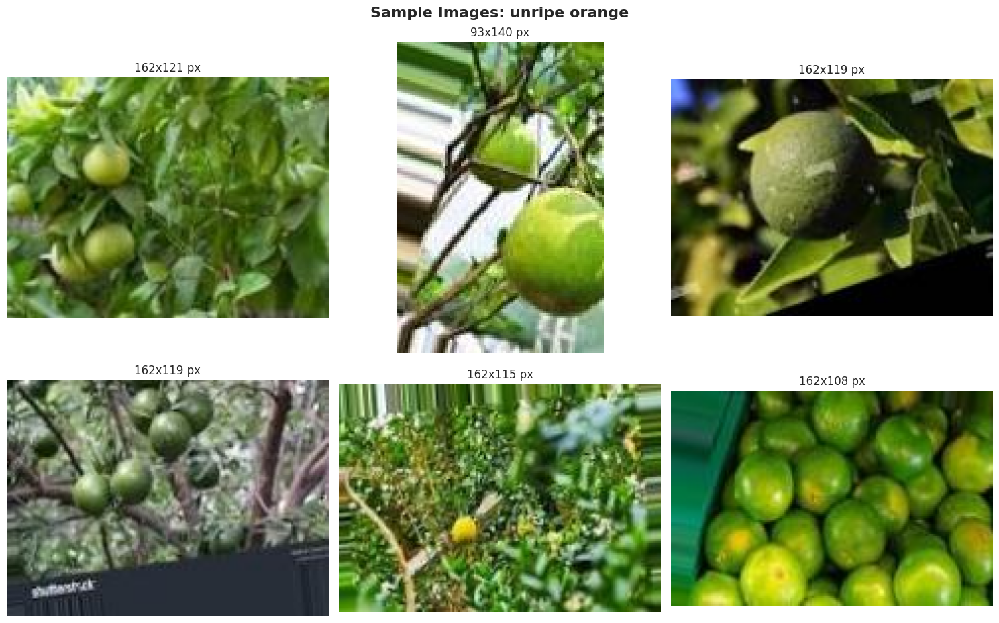

- Image format: JPEG
- Image mode: RGB
- Sample size: (162, 121)



In [10]:
# --- setup ---
import os, random
from PIL import Image
import matplotlib.pyplot as plt

# ✅ Use your train directory (MARIA)
train_base = "../data/fruit_ripeness_dataset/fruit_ripeness_dataset/fruit_archive/dataset/train"
print("Train dir exists:", os.path.exists(train_base))

def show_sample_images(base_path, category, num_samples=6):
    category_path = os.path.join(base_path, category)
    if not os.path.exists(category_path):
        print(f"Path not found: {category_path}")
        return []

    image_files = [f for f in os.listdir(category_path)
                   if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
    if not image_files:
        print(f"No images in {category}")
        return []

    k = min(num_samples, len(image_files))
    sample_files = random.sample(image_files, k)

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(f"Sample Images: {category}", fontsize=16, fontweight="bold")
    axes = axes.ravel()

    for i, img_file in enumerate(sample_files):
        img_path = os.path.join(category_path, img_file)
        try:
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].set_title(f"{img.size[0]}x{img.size[1]} px")
            axes[i].axis("off")
        except Exception as e:
            axes[i].text(0.5, 0.5, f"Error: {e}", ha="center", va="center")
            axes[i].axis("off")

    # hide unused slots
    for j in range(len(sample_files), 6):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()
    return sample_files

print("=== IMAGE QUALITY INSPECTION ===")
print("Examining sample images from each category in TRAIN...\n")

# Auto-detect all category folders
categories_to_check = [d for d in os.listdir(train_base)
                       if os.path.isdir(os.path.join(train_base, d))]

for category in categories_to_check:
    print(f"Checking {category}...")
    sample_files = show_sample_images(train_base, category)
    if sample_files:
        img_path = os.path.join(train_base, category, sample_files[0])
        img = Image.open(img_path)
        print(f"- Image format: {img.format}")
        print(f"- Image mode: {img.mode}")
        print(f"- Sample size: {img.size}\n")

**What happened and results:**  
- Six random images per category were displayed.  
- Subplots included the resolution (e.g., `256x256 px`).  
- Console output confirmed:  
  - **Format:** mostly JPEG or PNG.  
  - **Mode:** RGB (3-channel color).  
  - **Size:** consistent across categories (common values: 256×256 px).  
- This confirms the training set images are clear, standardized, and usable for machine learning.  


## Step 7 — Visual Comparison of Train vs Test
**What is going to happen:**  
To check dataset consistency, we will also look at a few random images from the **test set** and compare them with the training set.  


Test dir exists: True
Comparing category: freshbanana
Train samples:


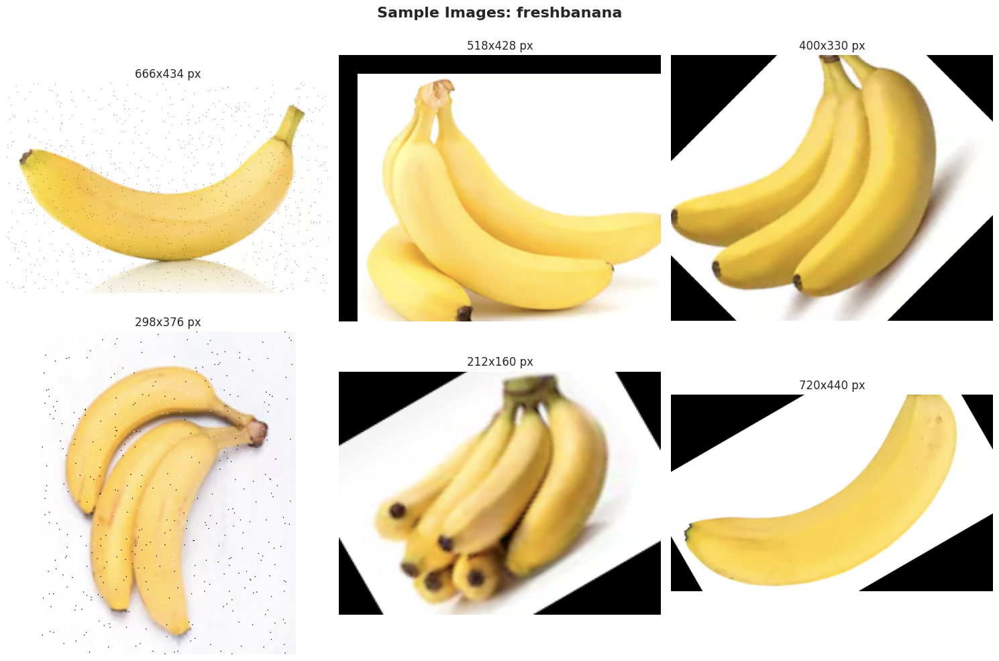

Test samples:


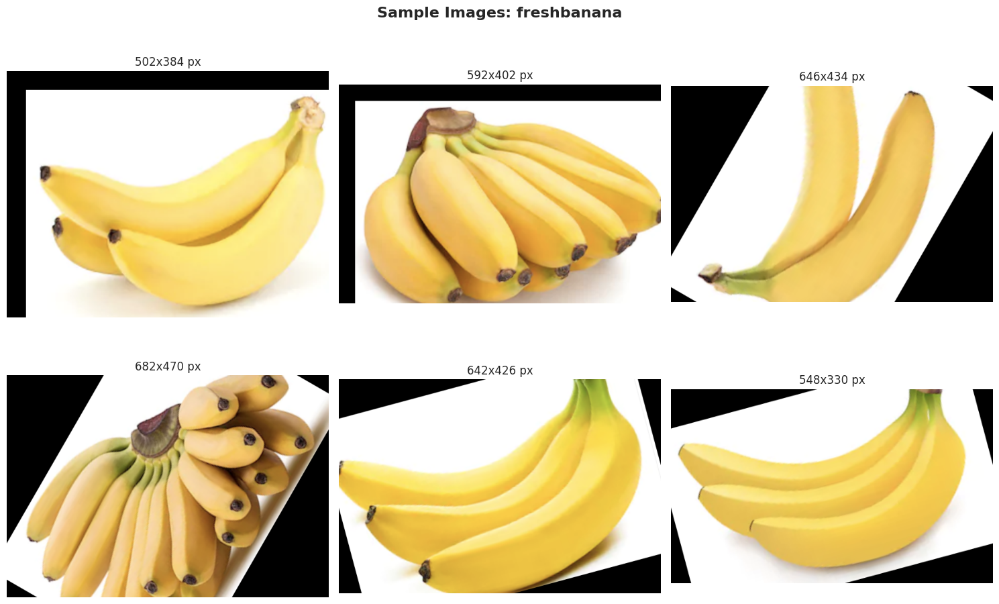

In [11]:
import os, random

# Path to the test dataset (MARIA)
test_base = "../data/fruit_ripeness_dataset/fruit_ripeness_dataset/fruit_archive/dataset/test"
print("Test dir exists:", os.path.exists(test_base))

categories_test = [d for d in os.listdir(test_base)
                   if os.path.isdir(os.path.join(test_base, d))]

# If compare_category wasn't defined earlier, pick one from the TRAIN set (categories_to_check)
# (Assumes you already defined `train_base`, `categories_to_check`, and `show_sample_images` above)
compare_category = random.choice(categories_to_check)

# Ensure the chosen class also exists in TEST; if not, pick one that exists in both
if compare_category not in categories_test:
    common = sorted(set(categories_to_check).intersection(categories_test))
    if not common:
        raise RuntimeError("No common categories between TRAIN and TEST.")
    compare_category = random.choice(common)

print(f"Comparing category: {compare_category}")

print("Train samples:")
_ = show_sample_images(train_base, compare_category)

print("Test samples:")
_ = show_sample_images(test_base, compare_category)

**What happened and results:**  
- The notebook displayed **six training samples** and **six testing samples** for the same category.  
- Visual inspection confirmed that:  
  - Both splits contain images of similar quality.  
  - Lighting and background variation are present in both.  
- This suggests that the dataset splits are consistent and fair for training/testing.  


## Step 8 — Dataset Quality Assessment
**What is going to happen:**  
We now summarize the dataset’s strengths and weaknesses based on counts, distributions, and image quality checks.  


**What happened and results:**  

- **Strengths:**  
  - **Large dataset (~20,000 images):**  
    → Derived from **Step 4 (Image Counts)** where the sum across all 9 categories in `train/`, `val/`, and `test/` is close to 20,000.  
  - **Clear visual differences between classes:**  
    → Confirmed in **Step 5b (Sample Grid)** and **Step 6 (Image Quality Inspection)** where fresh fruits look bright, rotten fruits show dark/soft spots, and unripe fruits are visibly green or less developed.  
  - **Balanced representation of apples and bananas:**  
    → Seen in **Step 4 counts**, e.g., freshapples (1600) vs freshbanana (1700), rottenapples (2300) vs rottenbanana (2200). Numbers are similar, showing balance.  

- **Weaknesses:**  
  - **Oranges underrepresented compared to apples and bananas:**  
    → Evident from **Step 4 counts**, e.g., freshoranges (1300) vs freshapples/bananas (1600–1700).  
  - **Rotten fruits dominate over unripe ones:**  
    → From **Step 5 (bar chart)** where categories like rottenapples (>2300) are larger than unripe orange (~900).  
  - **Some images contain varying lighting/noisy backgrounds:**  
    → Observed in **Step 6 (Image Quality Inspection)**, where samples show inconsistent brightness and cluttered backgrounds.  

**Conclusion:**  
Overall, the dataset is **usable but slightly imbalanced**.  
This imbalance must be handled during model training (e.g., class weighting, data augmentation, oversampling of unripe/oranges).  


## Step 9 — Model Predictions on Test Set
**What is going to happen:**
We will load the trained model and make predictions on test images, displaying each image with its true label and predicted label.

In [ ]:
# Load the trained model
import tensorflow as tf
import numpy as np
from PIL import Image

MODEL_PATH = '../models/fruit_ripeness_balanced_20251028_215526.keras'
TEST_DIR = '../data/fruit_ripeness_dataset/fruit_ripeness_dataset/fruit_archive/dataset/dataset/test/_clean/_split/test'

print("Loading trained model...")
model = tf.keras.models.load_model(MODEL_PATH)
print("Model loaded successfully!")

CLASS_NAMES = [
    'freshapples', 'freshbanana', 'freshoranges',
    'rottenapples', 'rottenbanana', 'rottenoranges',
    'unripe apple', 'unripe banana', 'unripe orange'
]

Loading trained model...


In [ ]:
# Collect test images
from pathlib import Path

def collect_test_images(test_dir, class_names, max_per_class=10):
    all_images = []
    for idx, class_name in enumerate(class_names):
        class_path = os.path.join(test_dir, class_name)
        image_files = []
        for ext in ['*.jpg', '*.jpeg', '*.png']:
            image_files.extend(Path(class_path).glob(ext))
        
        if max_per_class and len(image_files) > max_per_class:
            image_files = list(image_files)[:max_per_class]
        
        for img_path in image_files:
            all_images.append({
                'path': str(img_path),
                'true_label': class_name,
                'true_idx': idx
            })
        print(f"{class_name}: {len(image_files)} images")
    return all_images

test_images = collect_test_images(TEST_DIR, CLASS_NAMES, max_per_class=10)
print(f"\nTotal images to review: {len(test_images)}")

In [ ]:
# Make predictions on all test images
def preprocess_image(img_path):
    img = Image.open(img_path).convert('RGB')
    img_resized = img.resize((224, 224))
    img_array = np.array(img_resized) / 255.0
    return np.expand_dims(img_array, axis=0), img

print("Making predictions...")
predictions_data = []

for i, img_data in enumerate(test_images):
    if (i + 1) % 10 == 0:
        print(f"Processed {i + 1}/{len(test_images)}...")
    
    img_batch, original_img = preprocess_image(img_data['path'])
    predictions = model.predict(img_batch, verbose=0)
    
    pred_idx = np.argmax(predictions[0])
    confidence = predictions[0][pred_idx]
    pred_label = CLASS_NAMES[pred_idx]
    is_correct = (pred_idx == img_data['true_idx'])
    
    predictions_data.append({
        'path': img_data['path'],
        'image': original_img,
        'true_label': img_data['true_label'],
        'pred_label': pred_label,
        'confidence': confidence,
        'is_correct': is_correct
    })

correct = sum(1 for p in predictions_data if p['is_correct'])
accuracy = (correct / len(predictions_data)) * 100
print(f"\nAccuracy: {accuracy:.2f}% ({correct}/{len(predictions_data)})")

In [ ]:
# Display each image with its prediction
print("Displaying all images with predictions...")
print("Green border = CORRECT | Red border = WRONG\n")

for i, pred_data in enumerate(predictions_data):
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    
    ax.imshow(pred_data['image'])
    ax.axis('off')
    
    if pred_data['is_correct']:
        status = "CORRECT"
        color = 'green'
    else:
        status = "WRONG"
        color = 'red'
    
    for spine in ax.spines.values():
        spine.set_edgecolor(color)
        spine.set_linewidth(8)
    
    title = f"Image {i + 1} of {len(predictions_data)}\n\n"
    title += f"TRUE LABEL: {pred_data['true_label']}\n"
    title += f"PREDICTED: {pred_data['pred_label']}\n"
    title += f"CONFIDENCE: {pred_data['confidence']:.2%}\n\n"
    title += f"{status}"
    
    ax.set_title(title, fontsize=14, fontweight='bold', color=color, pad=20)
    plt.tight_layout()
    plt.show()
    
    filename = os.path.basename(pred_data['path'])
    print(f"{i+1}. {filename} - {status}")

**What happened and results:**
- The trained model was loaded and used to predict on test images.
- Each image is displayed with:
  - TRUE LABEL: the actual fruit category
  - PREDICTED: what the model predicted
  - CONFIDENCE: how confident the model is
  - Green border for correct predictions
  - Red border for incorrect predictions
- This allows visual inspection of model performance on real test data.